In [1]:
#IMPORTS
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
# import tensorflow.compat.v1 as tf
import zipfile

from collections import defaultdict
from io import StringIO
# from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

In [2]:
#Object detection imports
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

# # patch tf1 into `utils.ops`
# utils_ops.tf = tf.compat.v1

# # Patch the location of gfile
# tf.gfile = tf.io.gfile

In [3]:
#variables
MODEL_NAME = 'car_identifier_graph' 

# PATH_TO_CKPT = 'GUTS_2/' + MODEL_NAME + '/' +'frozen_inference_graph.pb'
# PATH_TO_CKPT = 'GUTS_2\' + MODEL_NAME + '\' +'frozen_inference_graph.pb'
PATH_TO_CKPT = "CAR_IDENTIFIER\\{}\\frozen_inference_graph.pb".format(MODEL_NAME)
# PATH_TO_CKPT = "GUTS_2/{}/frozen_inference_graph.pb".format(MODEL_NAME)

# PATH_TO_LABELS = os.path.join('GUTS_2\\training', 'object-detection.pbtxt')
# PATH_TO_LABELS = os.path.join('GUTS_2/training', 'object-detection.pbtxt')
# PATH_TO_LABELS = "GUTS_2/training/object-detection.pbtxt"
PATH_TO_LABELS = "CAR_IDENTIFIER\\training\\object-detection.pbtxt"

NUM_CLASSES = 3

print(PATH_TO_CKPT)

print(PATH_TO_LABELS)

CAR_IDENTIFIER\car_identifier_graph\frozen_inference_graph.pb
CAR_IDENTIFIER\training\object-detection.pbtxt


In [4]:
#Loading a "frozen" tensorflow model into memory
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')
#         tf.import_graph_def(od_graph_def)

# with tf.gfile.GFile(PATH_TO_CKPT, "rb") as f:
#     graph_def = tf.GraphDef()
#     graph_def.ParseFromString(f.read())
    
# with tf.Graph().as_default() as graph:
#     tf.import_graph_def(graph_def)
        

        
# detection_graph = tf.Graph()
# od_graph_def = tf.GraphDef()

# with open(PATH_TO_CKPT, 'rb') as fid:
#     serialized_graph = fid.read()
#     od_graph_def.ParseFormString(serialied_graph)
    
# with detection_graph.as_default():
#     tf.import_graph_def(od_graph_def, name='')

In [5]:
#Loading label map
# label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
# categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
# category_index = label_map_util.create_category_index(categories)

category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [6]:
#Helper code
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [7]:
#DETECTION SECTION, FINALLY 
# For the sake of simplicity we will use only 2 images:
# image1.jpg
# image2.jpg
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.

PATH_TO_TEST_IMAGES_DIR = "CAR_IDENTIFIER\\images"


import glob
TEST_IMAGE_PATHS = glob.glob("{}\\*.jpg".format(PATH_TO_TEST_IMAGES_DIR))  + glob.glob("{}/*.png".format(PATH_TO_TEST_IMAGES_DIR))

# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

print(PATH_TO_TEST_IMAGES_DIR)
print(TEST_IMAGE_PATHS)

CAR_IDENTIFIER\images
['CAR_IDENTIFIER\\images\\02d8755285596f2c0a9332009e03f83f.jpg', 'CAR_IDENTIFIER\\images\\0c6de01d20b662536e6b10b817381eeb.jpg', 'CAR_IDENTIFIER\\images\\0ca09a3d38c38e85e256abb48538835c.jpg', 'CAR_IDENTIFIER\\images\\3f16d50bdb7b984140db948b7308d145.jpg', 'CAR_IDENTIFIER\\images\\5bbc4fe2ba4828d7766a039a3cd81dda.jpg', 'CAR_IDENTIFIER\\images\\atheenthusiastcartist-porsche-911-992.jpg', 'CAR_IDENTIFIER\\images\\e07d00052917586d5060967326125f44.jpg', 'CAR_IDENTIFIER\\images\\e50f002607e10980e1933ea58744601c.jpg']


In [8]:
def run_inference_for_single_image(image, graph):
  with graph.as_default():
    with tf.Session() as sess:
      # Get handles to input and output tensors
      ops = tf.get_default_graph().get_operations()
      all_tensor_names = {output.name for op in ops for output in op.outputs}
      tensor_dict = {}
      for key in [
          'num_detections', 'detection_boxes', 'detection_scores',
          'detection_classes', 'detection_masks'
      ]:
        tensor_name = key + ':0'
        if tensor_name in all_tensor_names:
          tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(
              tensor_name)
      if 'detection_masks' in tensor_dict:
        # The following processing is only for single image
        detection_boxes = tf.squeeze(tensor_dict['detection_boxes'], [0])
        detection_masks = tf.squeeze(tensor_dict['detection_masks'], [0])
        # Reframe is required to translate mask from box coordinates to image coordinates and fit the image size.
        real_num_detection = tf.cast(tensor_dict['num_detections'][0], tf.int32)
        detection_boxes = tf.slice(detection_boxes, [0, 0], [real_num_detection, -1])
        detection_masks = tf.slice(detection_masks, [0, 0, 0], [real_num_detection, -1, -1])
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
            detection_masks, detection_boxes, image.shape[0], image.shape[1])
        detection_masks_reframed = tf.cast(
            tf.greater(detection_masks_reframed, 0.5), tf.uint8)
        # Follow the convention by adding back the batch dimension
        tensor_dict['detection_masks'] = tf.expand_dims(
            detection_masks_reframed, 0)
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')

      # Run inference
      output_dict = sess.run(tensor_dict,
                             feed_dict={image_tensor: np.expand_dims(image, 0)})

      # all outputs are float32 numpy arrays, so convert types as appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict[
          'detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
      if 'detection_masks' in output_dict:
        output_dict['detection_masks'] = output_dict['detection_masks'][0]
  return output_dict

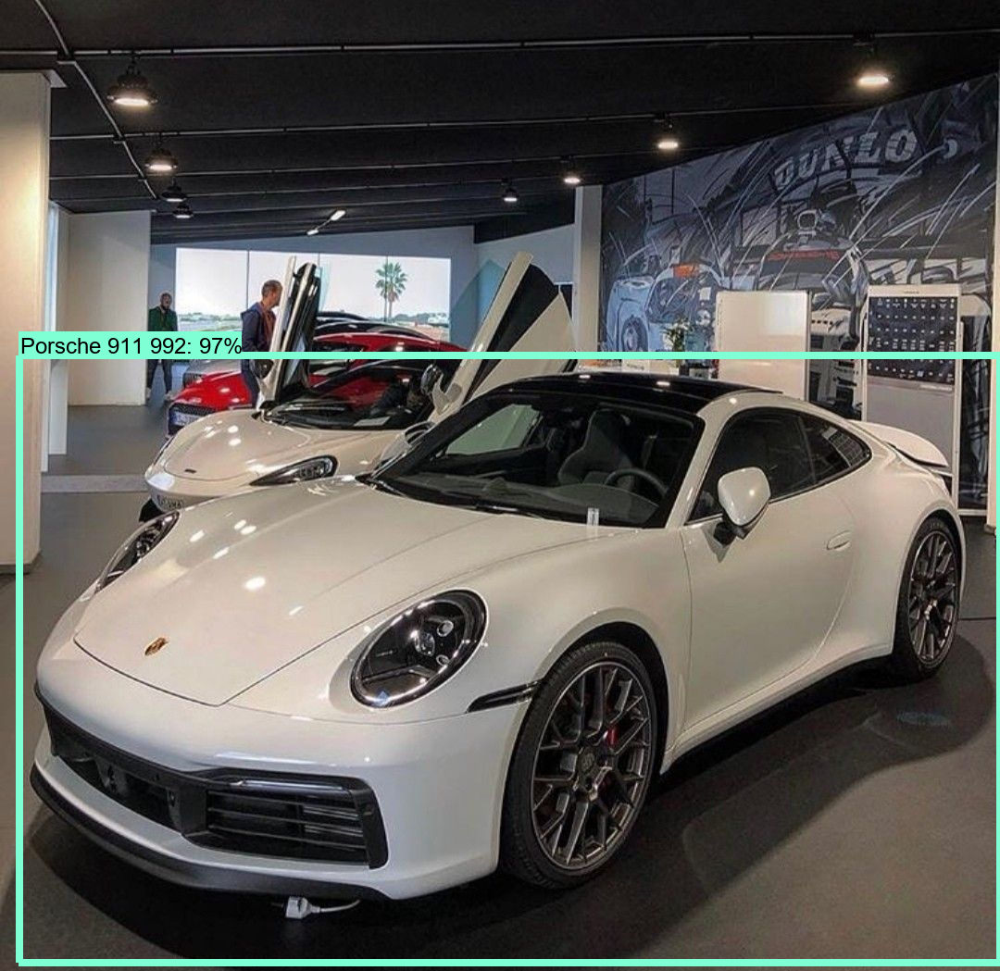

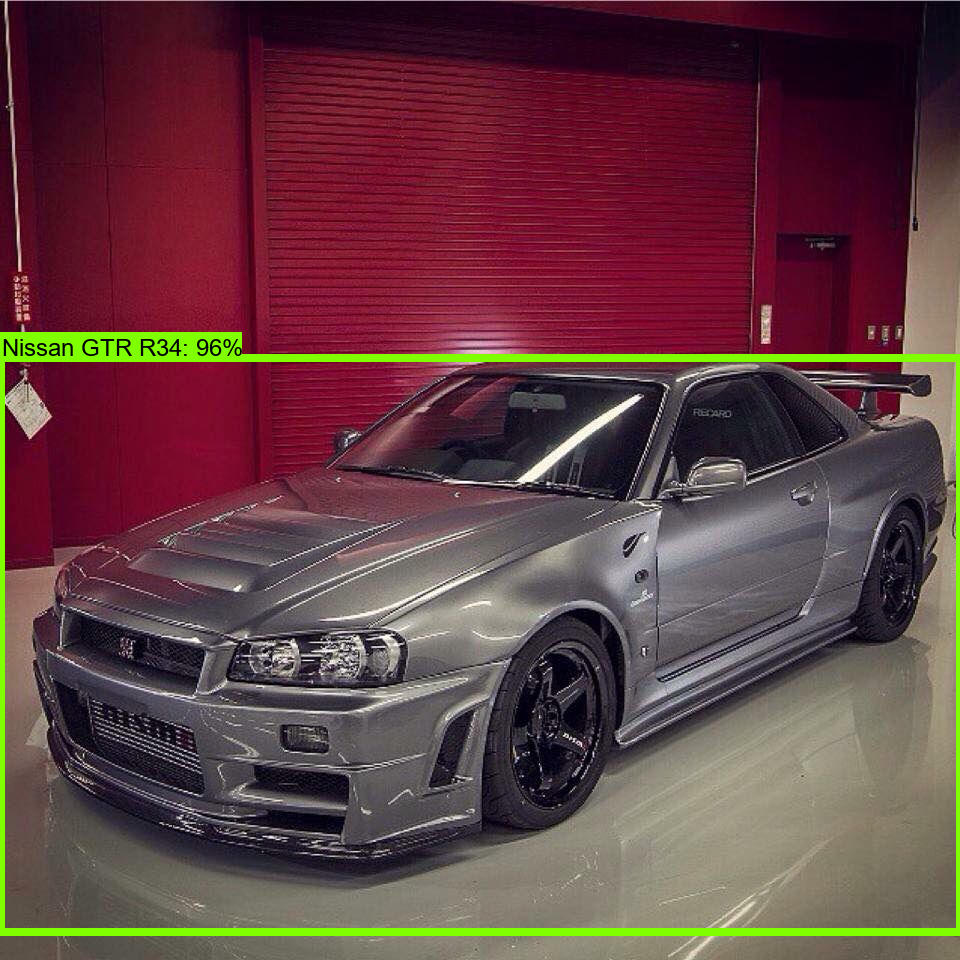

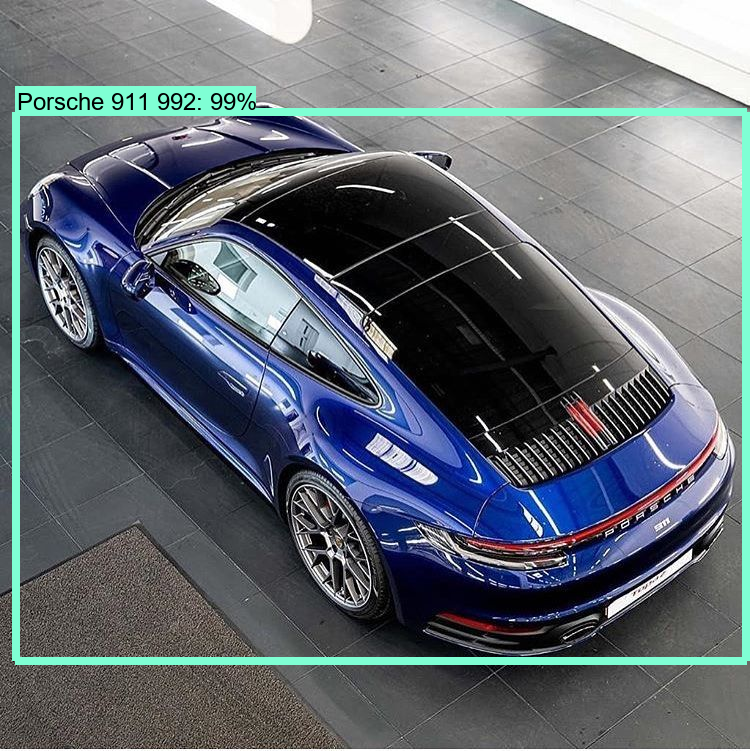

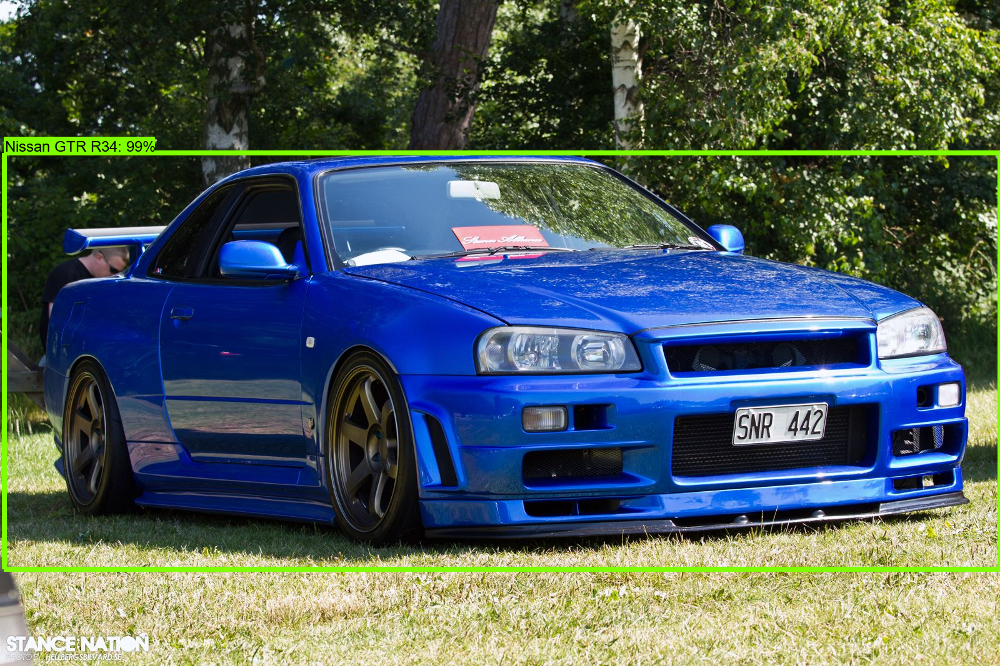

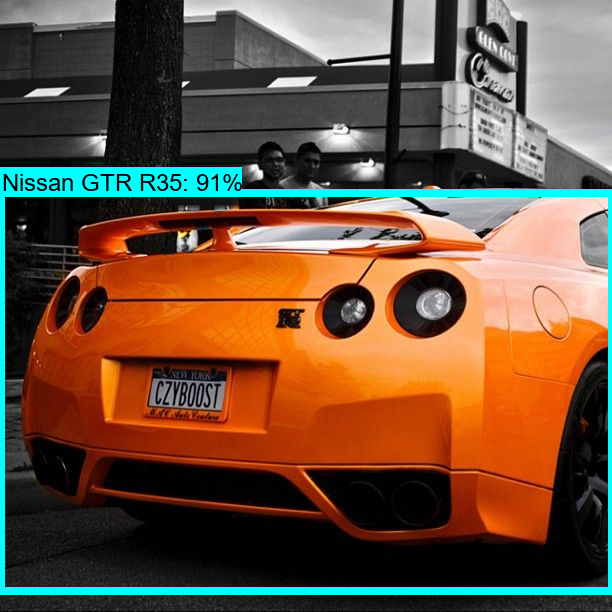

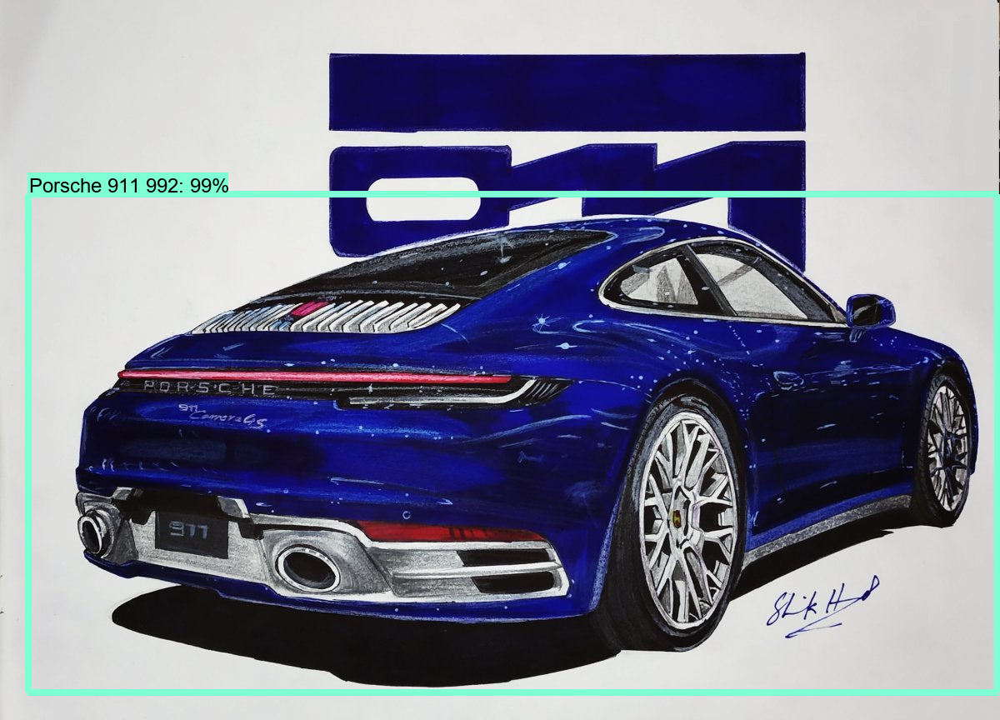

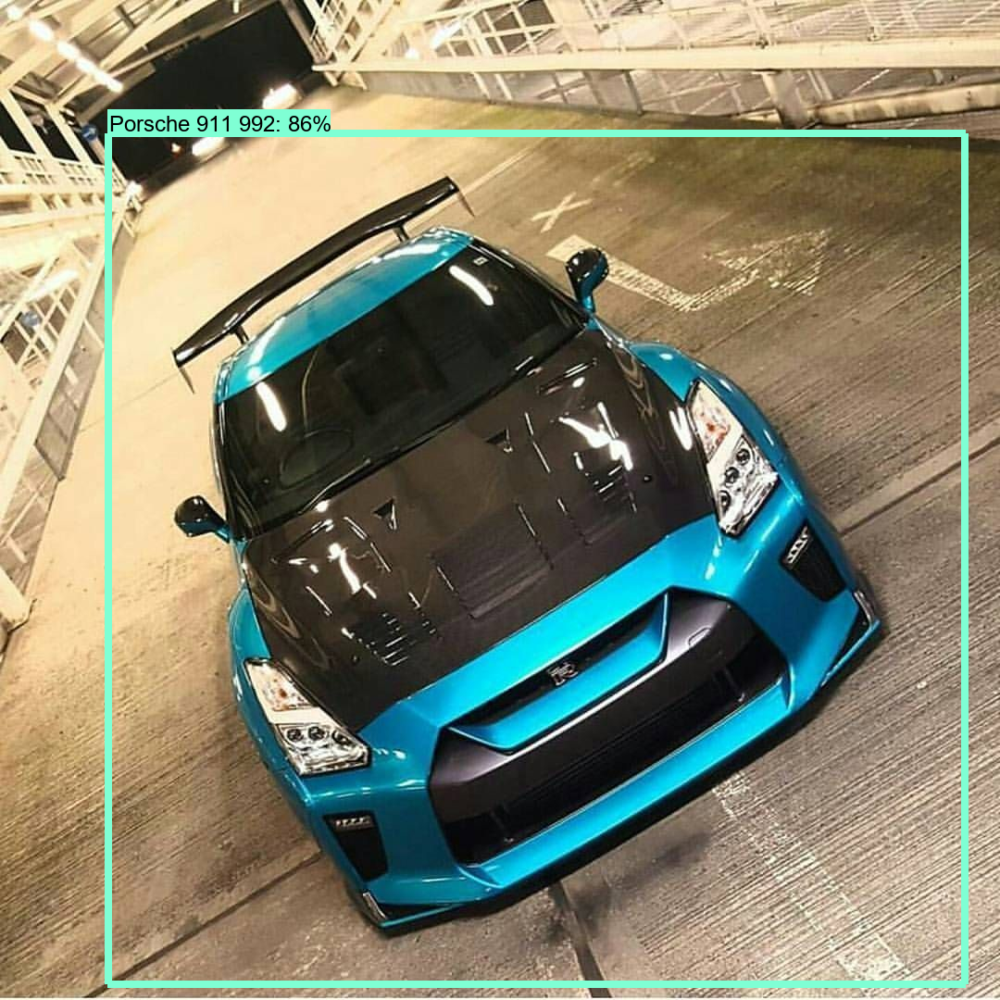

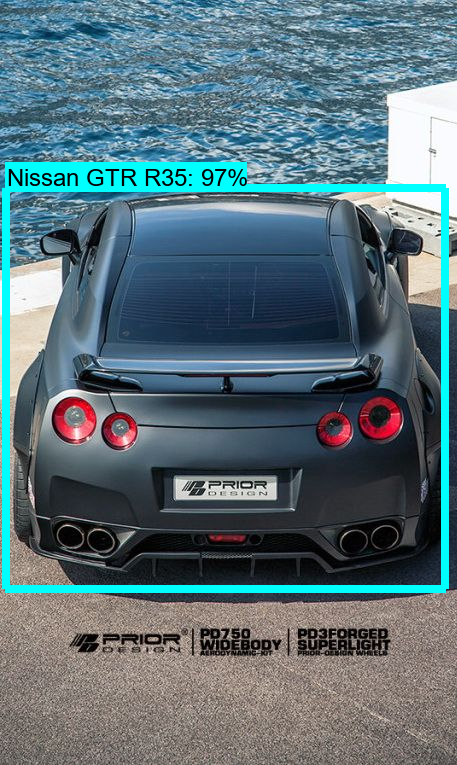

In [9]:
for image_path in TEST_IMAGE_PATHS:
    image = Image.open(image_path)
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = load_image_into_numpy_array(image)
    # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
    image_np_expanded = np.expand_dims(image_np, axis=0)
    # Actual detection.
    output_dict = run_inference_for_single_image(image_np, detection_graph)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
        output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks'),
      use_normalized_coordinates=True,
      line_thickness=8)
    plt.figure(figsize=IMAGE_SIZE)
    plt.imshow(image_np)
#     plt.show()
    display(Image.fromarray(image_np))